This example was taken from the book **The Essence of Chaos** by *Edward Lorenz*. 

$$\frac{dX}{dt} = U,$$

$$\frac{dY}{dt} = V,$$

$$\frac{dZ}{dt} = W,$$

$$\frac{dU}{dt} = -FH_X - cU,$$

$$\frac{dV}{dt} = -FH_Y - cV,$$

$$\frac{dW}{dt} = -g + F - cW.$$

In [2]:
using Plots
pyplot()

Plots.PyPlotBackend()

In [3]:
a = 0.25
b = 0.5
q = (2π)/4.0
p = (2π)/10.0

slope_parametrization(x,y) = -a*x .- b*cos(p*x).*cos(q*y)

slope_parametrization (generic function with 1 method)

In [8]:
function generate_slope(G::Function, xx_range, yy_range)
    
    slope = zeros(length(x_range), length(y_range))
    
    for i in 1:length(xx_range)
        for j in 1:length(xx_range)
            
            slope[i,j] = G(xx_range[i], yy_range[j])
            
        end
    end
    
    slope
    
end

generate_slope (generic function with 1 method)

In [9]:
x_range = 0:0.1:20
y_range = 0:0.1:20

0.0:0.1:20.0

In [10]:
sol = generate_slope(slope_parametrization, x_range, y_range)

201×201 Array{Float64,2}:
 -0.5       -0.493844  -0.475528  …  -0.475528  -0.493844  -0.5     
 -0.524013  -0.51787   -0.49959      -0.49959   -0.51787   -0.524013
 -0.546057  -0.53995   -0.521779     -0.521779  -0.53995   -0.546057
 -0.566144  -0.560097  -0.542105     -0.542105  -0.560097  -0.566144
 -0.584292  -0.578329  -0.560589     -0.560589  -0.578329  -0.584292
 -0.600528  -0.594674  -0.577254  …  -0.577254  -0.594674  -0.600528
 -0.614888  -0.609165  -0.592135     -0.592135  -0.609165  -0.614888
 -0.627414  -0.621844  -0.605271     -0.605271  -0.621844  -0.627414
 -0.638153  -0.632759  -0.616709     -0.616709  -0.632759  -0.638153
 -0.647164  -0.641966  -0.626502     -0.626502  -0.641966  -0.647164
 -0.654508  -0.649528  -0.63471   …  -0.63471   -0.649528  -0.654508
 -0.660257  -0.655513  -0.641401     -0.641401  -0.655513  -0.660257
 -0.664484  -0.659997  -0.646645     -0.646645  -0.659997  -0.664484
  ⋮                               ⋱                         ⋮       
 -5.1102

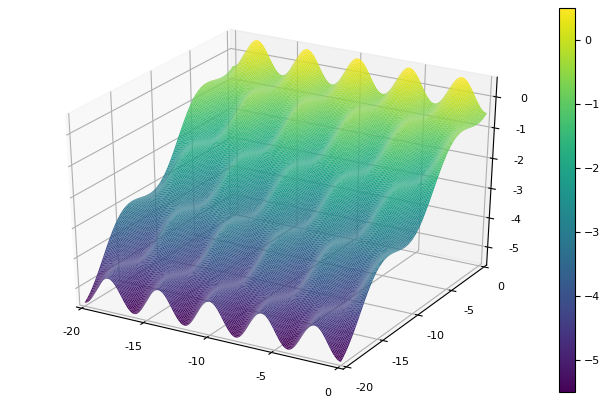

In [11]:
surface(-y_range, -x_range, sol, color=:viridis)

In [13]:
function runge_kutta_step_2(f::Function, x0, dt, F, H, c)
       
    k1 = f(x0, F, H, c) * dt
    k2 = f(x0 + k1/2, F, H, c) * dt
    k3 = f(x0 + k2/2, F, H, c) * dt
    k4 = f(x0 + k3, F, H, c) * dt
    x_new = x0 + (k1 + 2*k2 + 2*k3 + k4)/6
    
    return x_new
end

runge_kutta_step_2 (generic function with 1 method)

In [14]:
function runge_kutta_step(f::Function, x0, dt)
       
    k1 = f(x0) * dt
    k2 = f(x0 + k1/2) * dt
    k3 = f(x0 + k2/2) * dt
    k4 = f(x0 + k3) * dt
    x_new = x0 + (k1 + 2*k2 + 2*k3 + k4)/6
    
    return x_new
end

runge_kutta_step (generic function with 1 method)

In [15]:
dx(x0) = u0
dy(y0) = v0
dU(u0, F, H_x, c) = -F*H_x - c*u0
dV(v0, F, H_y, c) = -F*H_y - c*v0

dV (generic function with 1 method)

In [16]:
function ski_slope(x0, y0, u0, v0, n, dt)
    g = 9.81
    c = 0.5
    a = 0.25
    b = 0.5
    p = (2π)/10.0
    q = (2π)/4.0
   
    solution = zeros(n+1, 2)
    solution[1, 1] = x0
    solution[1,2] = y0
    
    for i in 2:n+1
        
        H = -a*x0 - b*cos(p*x0)*cos(q*y0) 
        H_x = -a + b*p*sin(p*x0)*cos(q*y0)
        H_xx = b*p^2 * cos(p*x0)*cos(q*y0)
        H_y = b*q*cos(p*x0)*sin(q*y0)
        H_yy = b*q^2 * cos(p*x0)*cos(q*y0)
        H_xy = -b*q*p*sin(p*x0)*sin(q*y0)
        
        F = (g + H_xx*u0^2 + 2*H_xy*u0*v0 + H_yy*v0^2)/(1 + H_x^2 + H_y^2)
        u_new = runge_kutta_step_2(dU, u0, dt, F, H_x, c)
        v_new = runge_kutta_step_2(dV, v0, dt, F, H_y, c)
        x_new = x0 + u0 * dt
        y_new = y0 + v0*dt
        
        solution[i, 1] = x_new
        solution[i, 2] = y_new
        
        x0 = copy(x_new)
        y0 = copy(y_new)
        u0 = copy(u_new)
        v0 = copy(v_new)
        
    end
    
    solution
    
end

ski_slope (generic function with 1 method)

### Example 1

Initial conditions: $x = 0.0$, $y = 0.5$, $U = 4.0$ and $V = 2.0$.

In [17]:
function various_sol_generator(N, x0, y0, u0, v0, n, dt, dy)
    solutions = Any[]
    
    for i in 1:N
        Δy = (i-1)*dy
        trayectory = ski_slope(x0, y0 + Δy, u0, v0, n, dt)
        push!(solutions, trayectory)
    end
    
    return solutions
end

various_sol_generator (generic function with 1 method)

In [18]:
function plot_several(A)
    
    plot(A[1][:,2], A[1][:,1], yflip=true, size =(300, 600), leg = false, grid = false)
    
    for i in 2:length(A)
        plot!(A[i][:,2], A[i][:,1])
    end
    plot!()
end

plot_several (generic function with 1 method)

In [19]:
x_1 = 0.0
y_1 = 0.5
U_1 = 4.0
V_1 = 2.0
n = 800
dt = 0.01

0.01

In [20]:
ski_slope(x_1, y_1, U_1, V_1, 800, dt)

801×2 Array{Float64,2}:
  0.0       0.5     
  0.04      0.52    
  0.080083  0.539273
  0.12023   0.557833
  0.160422  0.575697
  0.200644  0.592881
  0.240883  0.609402
  0.281124  0.625277
  0.321359  0.640522
  0.361575  0.655155
  0.401766  0.66919 
  0.441923  0.682643
  0.48204   0.695528
  ⋮                 
 26.6001    2.91641 
 26.6319    2.93611 
 26.6636    2.95554 
 26.6953    2.97471 
 26.7269    2.99363 
 26.7584    3.0123  
 26.7899    3.03073 
 26.8213    3.04894 
 26.8527    3.06692 
 26.884     3.08469 
 26.9153    3.10225 
 26.9465    3.11961 

In [21]:
t_e1_30 = various_sol_generator(7, x_1, y_1, U_1, V_1, 800, dt, 0.1)

7-element Array{Any,1}:
 [0.0 0.5; 0.04 0.52; … ; 26.915262325240644 3.102247051298836; 26.946486614572805 3.119605201554586]              
 [0.0 0.6; 0.04 0.62; … ; 28.439497385078074 9.480051317002573; 28.47016140566652 9.463685174705242]               
 [0.0 0.7; 0.04 0.72; … ; 28.503581501530984 3.827247696626856; 28.537791135887208 3.8047506683846977]             
 [0.0 0.8; 0.04 0.8200000000000001; … ; 31.44200854554481 12.541730958735927; 31.48126456514505 12.558965070627721]
 [0.0 0.9; 0.04 0.92; … ; 31.6089275599248 7.0352709618454075; 31.64520790415936 7.058352538826301]                
 [0.0 1.0; 0.04 1.02; … ; 30.827985141632375 4.6907849629281095; 30.871964965272934 4.672595982160171]             
 [0.0 1.1; 0.04 1.12; … ; 32.33967143868208 8.1800641958608; 32.36940581076629 8.211515054902359]                  

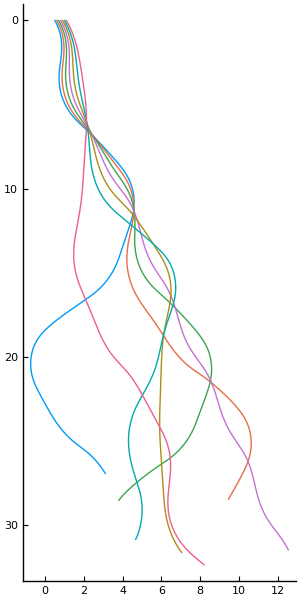

In [22]:
plot_several(t_e1_30)

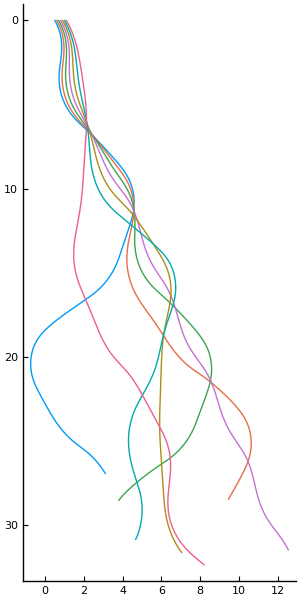

In [23]:
plot_several(t_e1_30)

The same initial contidions but we let the 7 boards travel 60 meters

In [24]:
t_e1_60 = various_sol_generator(7, x_1, y_1, U_1, V_1, 1600, 0.01, 0.1)

7-element Array{Any,1}:
 [0.0 0.5; 0.04 0.52; … ; 54.33353702559121 3.7196967127849345; 54.3621368426055 3.710738122315613]               
 [0.0 0.6; 0.04 0.62; … ; 56.75946721126459 -2.523620845029545; 56.80118078731549 -2.51812429138225]              
 [0.0 0.7; 0.04 0.72; … ; 55.938969099031496 10.63114092857189; 55.967323987389285 10.601056478292541]            
 [0.0 0.8; 0.04 0.8200000000000001; … ; 60.178461771854955 22.42089109931625; 60.20948769910684 22.42851520157835]
 [0.0 0.9; 0.04 0.92; … ; 60.57331420663769 19.58555859012676; 60.60781167318664 19.614275434533145]              
 [0.0 1.0; 0.04 1.02; … ; 61.70363025584667 -8.444561107315394; 61.73554074593806 -8.47341742046345]              
 [0.0 1.1; 0.04 1.12; … ; 60.92042645427245 13.434327078628902; 60.95896791807307 13.425770039756511]             

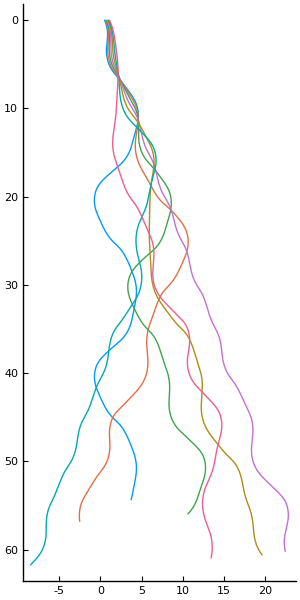

In [25]:
plot_several(t_e1_60)

## Example 2
Initial conditions just spaced $1$mm apart from $0.497$ to $0.503$.

In [26]:
x_1 = 0.0
y_1 = 0.497
U_1 = 4.0
V_1 = 2.0
n = 800
dt = 0.01
t_e2_60 = various_sol_generator(7, x_1, y_1, U_1, V_1, 1600, 0.01, 0.01)

7-element Array{Any,1}:
 [0.0 0.497; 0.04 0.517; … ; 55.873510584162695 -6.185372963107436; 55.913584750919824 -6.211196438888784]            
 [0.0 0.507; 0.04 0.527; … ; 54.45626320240853 3.0932763784649007; 54.48401012940695 3.0749812354532273]              
 [0.0 0.517; 0.04 0.537; … ; 53.971149395658344 3.3453675266175735; 53.99980676776154 3.329927872851987]              
 [0.0 0.527; 0.04 0.547; … ; 56.65523776002899 -9.947986042534316; 56.686799631417244 -9.98292747330527]              
 [0.0 0.537; 0.04 0.557; … ; 57.590343127882015 -14.704993506627373; 57.629085307436355 -14.698447220878718]          
 [0.0 0.547; 0.04 0.5670000000000001; … ; 54.646205964669946 2.084924835956762; 54.690234596537174 2.0993545758021828]
 [0.0 0.5569999999999999; 0.04 0.577; … ; 58.05921594052514 10.340222259661024; 58.090905026333104 10.355318855156886]

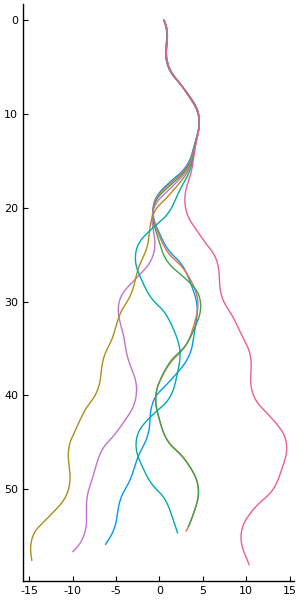

In [27]:
plot_several(t_e2_60)

In [28]:
t_e3_600 = various_sol_generator(1, x_1, y_1, U_1, V_1, 17000, 0.01, 0.01)

1-element Array{Any,1}:
 [0.0 0.497; 0.04 0.517; … ; 589.8131139507678 -33.435908253150394; 589.8444342491445 -33.42636858933261]

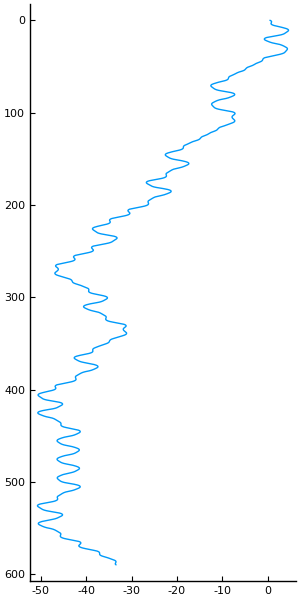

In [29]:
plot_several(t_e3_600)

# Compact system

In [30]:
function compactor(x, lower_bound, upper_bound)
    
    if x > upper_bound
        return x%upper_bound - upper_bound
    elseif x < lower_bound 
        return x%lower_bound - lower_bound
    else
        return x
    end
end

compactor (generic function with 1 method)

In [70]:
function ski_slope_compact(x0, y0, u0, v0, n, dt)
    g = 9.81
    c = 0.5
    a = 0.25
    b = 0.5
    p = (2π)/10.0
    q = (2π)/4.0
   
    solution = zeros(n+1, 4)
    solution[1, 1] = x0
    solution[1,2] = y0
    solution[1, 3] = u0
    solution[1,4] = v0
    
    for i in 2:n+1
        
        H = -a*x0 - b*cos(p*x0)*cos(q*y0) 
        H_x = -a + b*p*sin(p*x0)*cos(q*y0)
        H_xx = b*p^2 * cos(p*x0)*cos(q*y0)
        H_y = b*q*cos(p*x0)*sin(q*y0)
        H_yy = b*q^2 * cos(p*x0)*cos(q*y0)
        H_xy = -b*q*p*sin(p*x0)*sin(q*y0)
        
        F = (g + H_xx*u0^2 + 2*H_xy*u0*v0 + H_yy*v0^2)/(1 + H_x^2 + H_y^2)
        u_new = runge_kutta_step_2(dU, u0, dt, F, H_x, c)
        v_new = runge_kutta_step_2(dV, v0, dt, F, H_y, c)
        x_new = compactor(x0 + u0 * dt, -5., 5.)
        y_new = compactor(y0 + v0*dt, -2, 2)
        
        solution[i, 1] = x_new
        solution[i, 2] = y_new
        solution[i, 3] = u_new
        solution[i, 4] = v_new
        
        x0 = copy(x_new)
        y0 = copy(y_new)
        u0 = copy(u_new)
        v0 = copy(v_new)
        
    end
    
    solution
    
end

ski_slope_compact (generic function with 1 method)

In [71]:
ccc = ski_slope_compact(x_1, y_1, U_1, V_1, 800, dt)

801×4 Array{Float64,2}:
  0.0         0.497     4.0      2.0    
  0.04        0.517     4.00841  1.92731
  0.0800841   0.536273  4.01486  1.85611
  0.120233    0.554834  4.01953  1.78648
  0.160428    0.572699  4.02262  1.71849
  0.200654    0.589884  4.02429  1.65218
  0.240897    0.606406  4.02471  1.58755
  0.281144    0.622281  4.024    1.52457
  0.321384    0.637527  4.02231  1.46321
  0.361607    0.652159  4.01974  1.40342
  0.401805    0.666193  4.01642  1.34513
  0.441969    0.679645  4.01244  1.28828
  0.482093    0.692527  4.00788  1.23281
  ⋮                                     
 -3.37914    -1.06414   3.2278   1.85042
 -3.34686    -1.04564   3.22111  1.8239 
 -3.31465    -1.0274    3.21463  1.79828
 -3.2825     -1.00942   3.2084   1.7735 
 -3.25042    -0.991683  3.20243  1.74952
 -3.21839    -0.974188  3.19676  1.72631
 -3.18643    -0.956925  3.1914   1.70384
 -3.15451    -0.939887  3.18639  1.68209
 -3.12265    -0.923066  3.18173  1.66102
 -3.09083    -0.906456  3.17747  

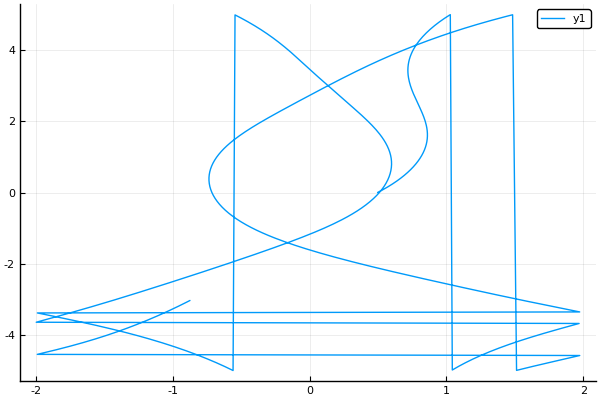

In [72]:
plot(ccc[:,2], ccc[:,1])

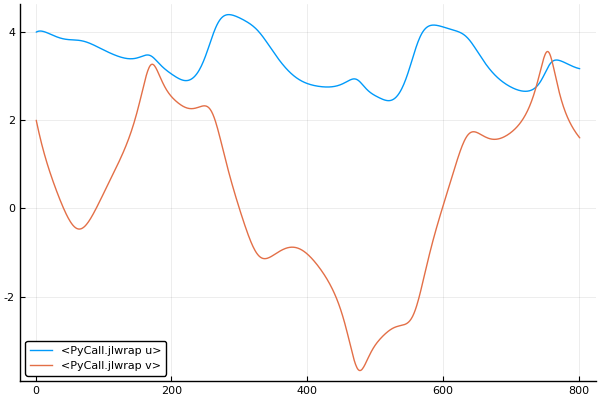

In [73]:
plot(ccc[:,3], label = 'u')
plot!(ccc[:,4], label = 'v')

Now we want to make $U$ to be constant in time. For this we need to equip our sled with a brake and a motor to be able to mantain the speed while going through the moguls.

In [74]:
function ski_slope_compact_2(x0, y0, u0, v0, n, dt)
    g = 9.81
    c = 0.5
    a = 0.25
    b = 0.5
    p = (2π)/10.0
    q = (2π)/4.0
   
    solution = zeros(n+1, 4)
    solution[1, 1] = x0
    solution[1,2] = y0
    solution[1, 3] = u0
    solution[1,4] = v0
    
    for i in 2:n+1
        
        H = -a*x0 - b*cos(p*x0)*cos(q*y0) 
        H_x = -a + b*p*sin(p*x0)*cos(q*y0)
        H_xx = b*p^2 * cos(p*x0)*cos(q*y0)
        H_y = b*q*cos(p*x0)*sin(q*y0)
        H_yy = b*q^2 * cos(p*x0)*cos(q*y0)
        H_xy = -b*q*p*sin(p*x0)*sin(q*y0)
        
        F = (g + H_xx*u0^2 + 2*H_xy*u0*v0 + H_yy*v0^2)/(1 + H_x^2 + H_y^2)
        u_new = u0#runge_kutta_step_2(dU, u0, dt, F, H_x, c)
        v_new = runge_kutta_step_2(dV, v0, dt, F, H_y, c)
        x_new = compactor(x0 + u0 * dt, -2.5, 2.5)
        y_new = compactor(y0 + v0*dt, -2, 2)
        
        solution[i, 1] = x_new
        solution[i, 2] = y_new
        solution[i, 3] = u_new
        solution[i, 4] = v_new
        
        x0 = copy(x_new)
        y0 = copy(y_new)
        u0 = copy(u_new)
        v0 = copy(v_new)
        
    end
    
    solution
    
end

ski_slope_compact_2 (generic function with 1 method)

In [75]:
ccc = ski_slope_compact_2(x_1, y_1, U_1, V_1, 800, dt)

801×4 Array{Float64,2}:
 0.0    0.497       4.0  2.0    
 0.04   0.517       4.0  1.92731
 0.08   0.536273    4.0  1.85614
 0.12   0.554835    4.0  1.78657
 0.16   0.5727      4.0  1.71866
 0.2    0.589887    4.0  1.65242
 0.24   0.606411    4.0  1.58786
 0.28   0.62229     4.0  1.52494
 0.32   0.637539    4.0  1.46362
 0.36   0.652175    4.0  1.40386
 0.4    0.666214    4.0  1.34559
 0.44   0.67967     4.0  1.28875
 0.48   0.692557    4.0  1.23326
 ⋮                              
 1.56  -0.121059    4.0  2.27574
 1.6   -0.0983018   4.0  2.27785
 1.64  -0.0755233   4.0  2.2768 
 1.68  -0.0527553   4.0  2.27287
 1.72  -0.0300267   4.0  2.26636
 1.76  -0.00736304  4.0  2.2576 
 1.8    0.015213    4.0  2.24692
 1.84   0.0376821   4.0  2.23463
 1.88   0.0600284   4.0  2.22104
 1.92   0.0822388   4.0  2.20646
 1.96   0.104303    4.0  2.19115
 2.0    0.126215    4.0  2.17537

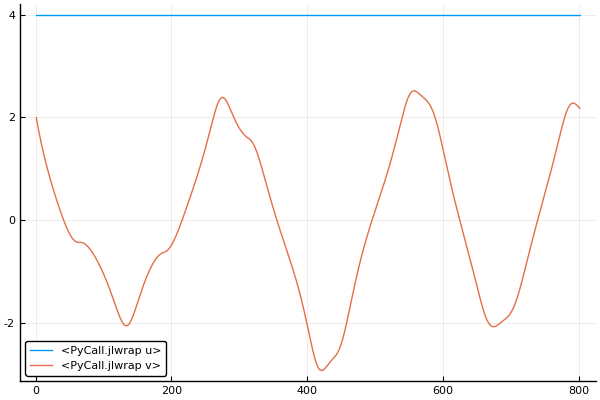

In [76]:
plot(ccc[:,3], label = 'u')
plot!(ccc[:,4], label = 'v')

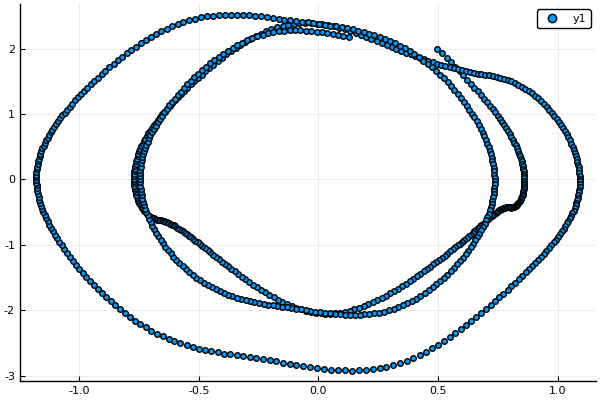

In [77]:
scatter(ccc[:,2], ccc[:,4])

# Enssembles 

In [78]:
function ski_slope_enssemble(x0, y0, v0, u0::Float64 , n::Int, dt::Float64, N::Int)
    g = 9.81
    c = 0.5
    a = 0.25
    b = 0.5
    p = (2π)/10.0
    q = (2π)/4.0
   
    x_sol = zeros(N, n+1)
    y_sol = zeros(N, n+1)
    v_sol = zeros(N, n+1)
    
    x_sol[:, 1] = x0
    y_sol[:, 1] = y0
    v_sol[:, 1] = v0
    
    for i in 1:n
        for k in 1:N
                
            x_i = x_sol[k, i]
            y_i = y_sol[k, i]
            v_i = v_sol[k, i]

            H = -a*x_i - b*cos(p*x_i)*cos(q*y_i) 
            H_x = -a + b*p*sin(p*x_i)*cos(q*y_i)
            H_xx = b*p^2 * cos(p*x_i)*cos(q*y_i)
            H_y = b*q*cos(p*x_i)*sin(q*y_i)
            H_yy = b*q^2 * cos(p*x_i)*cos(q*y_i)
            H_xy = -b*q*p*sin(p*x_i)*sin(q*y_i)

            F = (g + H_xx*u0^2 + 2*H_xy*u0*v_i + H_yy*v_i^2)/(1 + H_x^2 + H_y^2)
            v_new = runge_kutta_step_2(dV, v_i, dt, F, H_y, c)
            x_new = compactor(x_i + u0 * dt, -5., 5.)
            y_new = compactor(y_i + v_i*dt, -2, 2)

            x_sol[k, i+1] = x_new
            y_sol[k, i+1] = y_new
            v_sol[k, i+1] = v_new
                
        
        end
    end
    
    x_sol, y_sol, v_sol
    
end

ski_slope_enssemble (generic function with 1 method)

In [122]:
NN = 10000
XX0 = zeros(NN)#rand(NN)*5 .- 2.5
YY0 = rand(NN)*4 .- 2.0
VV0 = rand(NN)*10 .- 5

10000-element Array{Float64,1}:
 -3.75844107121728   
 -3.7306754757878724 
  1.8807179695547571 
  1.286553738678025  
 -1.7599471956408652 
 -3.4403510888890687 
 -0.6348967891579012 
  1.5650217095909706 
 -1.6211058341609075 
 -3.357584664274389  
 -0.48385823196310973
 -2.481354026441631  
 -1.7691393541364775 
  ⋮                  
  3.348727097844437  
 -1.6965874611039844 
 -3.1089848784209018 
  3.052060938789925  
  0.23401897184300147
  3.461864694096537  
  0.5038212992956286 
  1.8232419149435897 
  1.80979319085933   
  2.0844877445008176 
  0.15481934610698023
  2.3874721458040593 

In [123]:
xa, ya, va = ski_slope_enssemble(XX0, YY0, VV0, 3.5, 5000, 0.01, NN)

([0.0 0.035 … 4.9650000000003685 -4.999999999999631; 0.0 0.035 … 4.9650000000003685 -4.999999999999631; … ; 0.0 0.035 … 4.9650000000003685 -4.999999999999631; 0.0 0.035 … 4.9650000000003685 -4.999999999999631], [1.3788098109039542 1.3412254001917814 … -1.4603074526352289 -1.454493203038941; 1.2800593557201383 1.2427526009622596 … -1.485059759961694 -1.479184556620439; … ; -0.6550297783748533 -0.6534815849137835 … 1.1914404250590396 1.213906622270302; 0.5434957774750666 0.5673704989331072 … 1.8544834263008683 1.8743846697621602], [-3.75844107121728 -3.7339573564421147 … 0.5814249596287873 0.5297657745427021; -3.7306754757878724 -3.718706867935828 … 0.5875203341255011 0.5363810170364266; … ; 0.15481934610698023 0.2030932003825586 … 2.246619721126248 2.291578026982298; 2.3874721458040593 2.3086110504381074 … 1.9901243461292004 2.0075071014549404])

In [124]:
2/3.5

0.5714285714285714

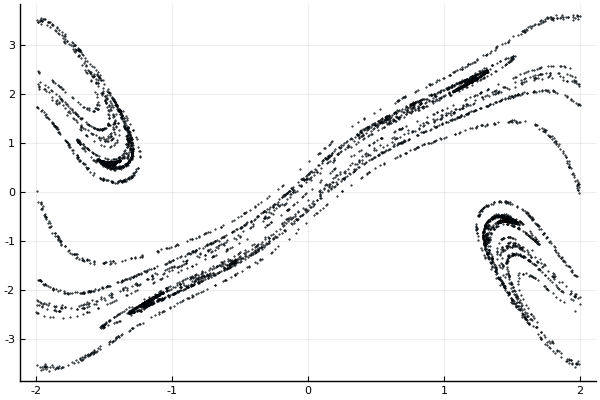

In [138]:
st = 3000
scatter(ya[:, st], va[:, st], markersize = 0.5, legend=false)


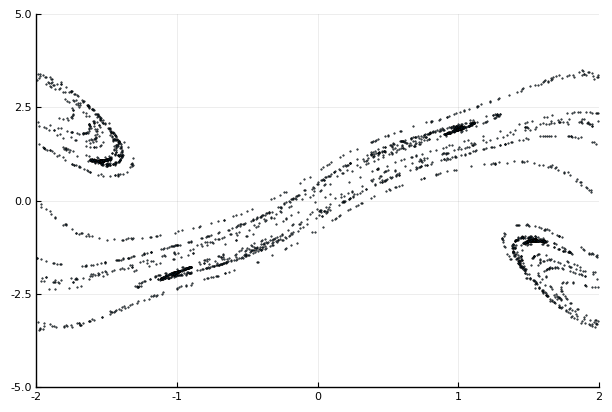

┌ Info: Saved animation to 
│   fn = /Users/claudiopierard/Projects/moguls_chaos/tmp.gif
└ @ Plots /Users/claudiopierard/.julia/packages/Plots/AXUqs/src/animation.jl:98


Plots.AnimatedGif("/Users/claudiopierard/Projects/moguls_chaos/tmp.gif")
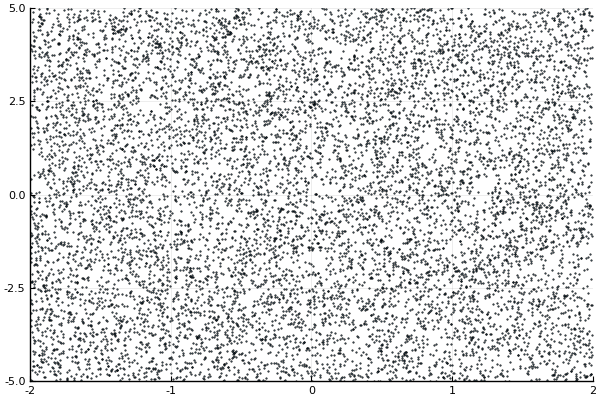

In [139]:

@gif for i=1:5000
    scatter(ya[:, i], va[:, i], markersize = 0.5, legend=false)
    ylims!(-5,5)
    xlims!(-2,2)
end every 10
